In [1]:
## This is the Jupyter Notebook file we'll use on the live workshop demo.

In [2]:
import pandas as pd

data = pd.read_csv("us_tornado_dataset_1950_2021.csv")
data.head()

,yr,mo,dy,date,st,mag,inj,fat,slat,slon,elat,elon,len,wid
0,1950,1,3,1950-01-03,IL,3,3,0,39.10,-89.30,39.12,-89.23,3.6,130
1,1950,1,3,1950-01-03,MO,3,3,0,38.77,-90.22,38.83,-90.03,9.5,150
2,1950,1,3,1950-01-03,OH,1,1,0,40.88,-84.58,0.00,0.00,0.1,10
3,1950,1,13,1950-01-13,AR,3,1,1,34.40,-94.37,0.00,0.00,0.6,17
4,1950,1,25,1950-01-25,IL,2,0,0,41.17,-87.33,0.00,0.00,0.1,100


In [3]:
## Convert the date attribute into datetime format.
data['date'] = pd.to_datetime(data['date'])

In [4]:
data.head()

,yr,mo,dy,date,st,mag,inj,fat,slat,slon,elat,elon,len,wid
0,1950,1,3,1950-01-03,IL,3,3,0,39.10,-89.30,39.12,-89.23,3.6,130
1,1950,1,3,1950-01-03,MO,3,3,0,38.77,-90.22,38.83,-90.03,9.5,150
2,1950,1,3,1950-01-03,OH,1,1,0,40.88,-84.58,0.00,0.00,0.1,10
3,1950,1,13,1950-01-13,AR,3,1,1,34.40,-94.37,0.00,0.00,0.6,17
4,1950,1,25,1950-01-25,IL,2,0,0,41.17,-87.33,0.00,0.00,0.1,100


In [5]:
## Check if we have any missing values in dataset.
data.isnull().values.any() 

False

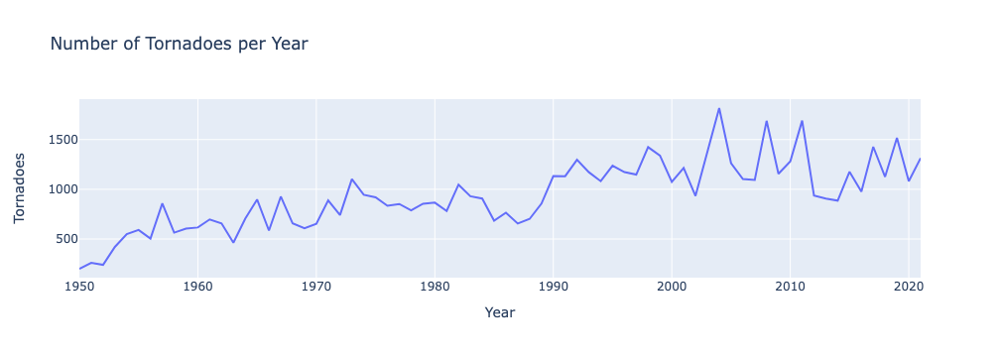

In [6]:
import plotly.express as px

yearly_data = data['yr'].value_counts().reset_index().sort_values(by='index')
yearly_data.columns = ['Year', 'Tornadoes']

fig = px.line(yearly_data, x='Year', y='Tornadoes', title='Number of Tornadoes per Year')
fig.show()

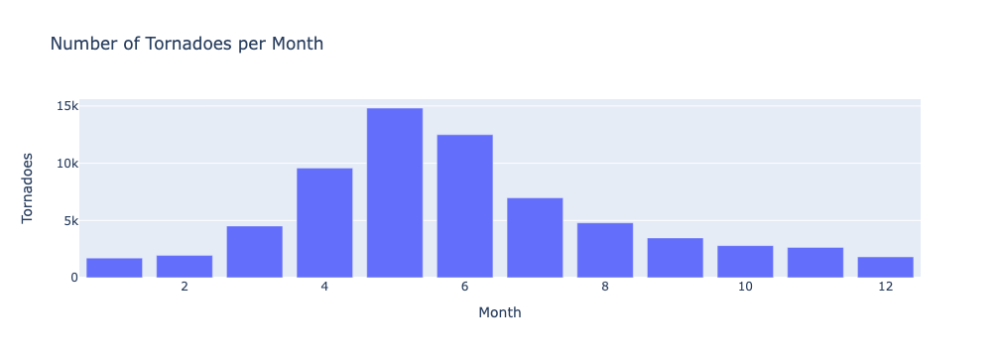

In [7]:
monthly_data = data['mo'].value_counts().reset_index().sort_values(by='index')
monthly_data.columns = ['Month', 'Tornadoes']

fig = px.bar(monthly_data, x='Month', y='Tornadoes', title='Number of Tornadoes per Month')
fig.show()


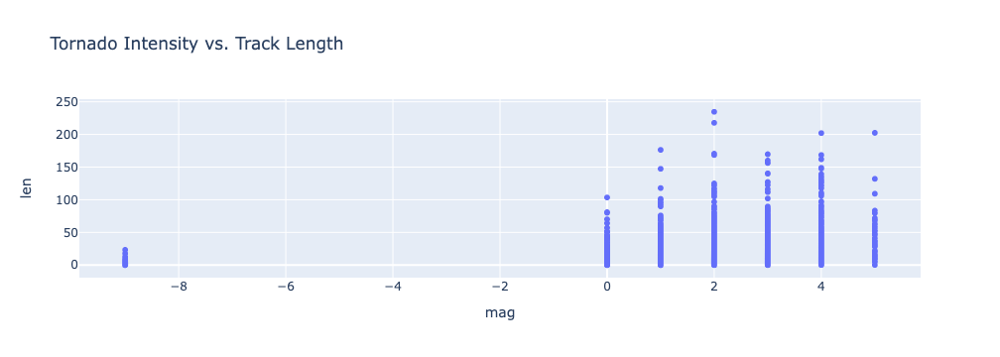

In [8]:
fig = px.scatter(data, x='mag', y='len', title='Tornado Intensity vs. Track Length')
fig.show()


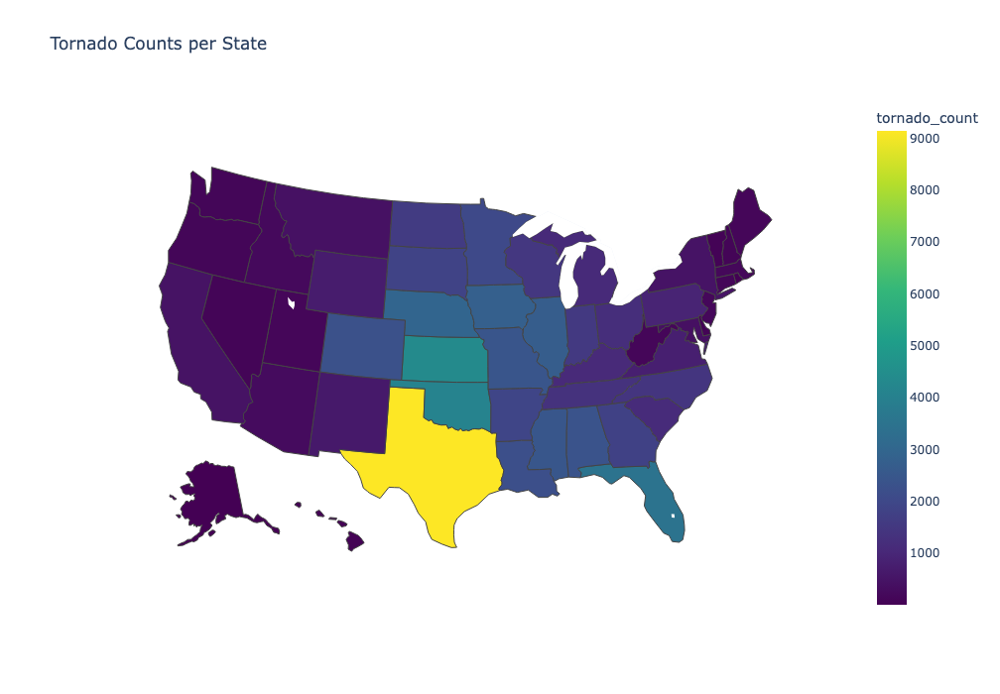

In [11]:
import plotly.express as px

state_counts = data['st'].value_counts().reset_index()
state_counts.columns = ['state', 'tornado_count']

fig = px.choropleth(state_counts, locations='state', color='tornado_count',
                    locationmode='USA-states', scope='usa',
                    title='Tornado Counts per State',
                    color_continuous_scale='viridis')

fig.update_layout(height=700, width=1000)
fig.show()


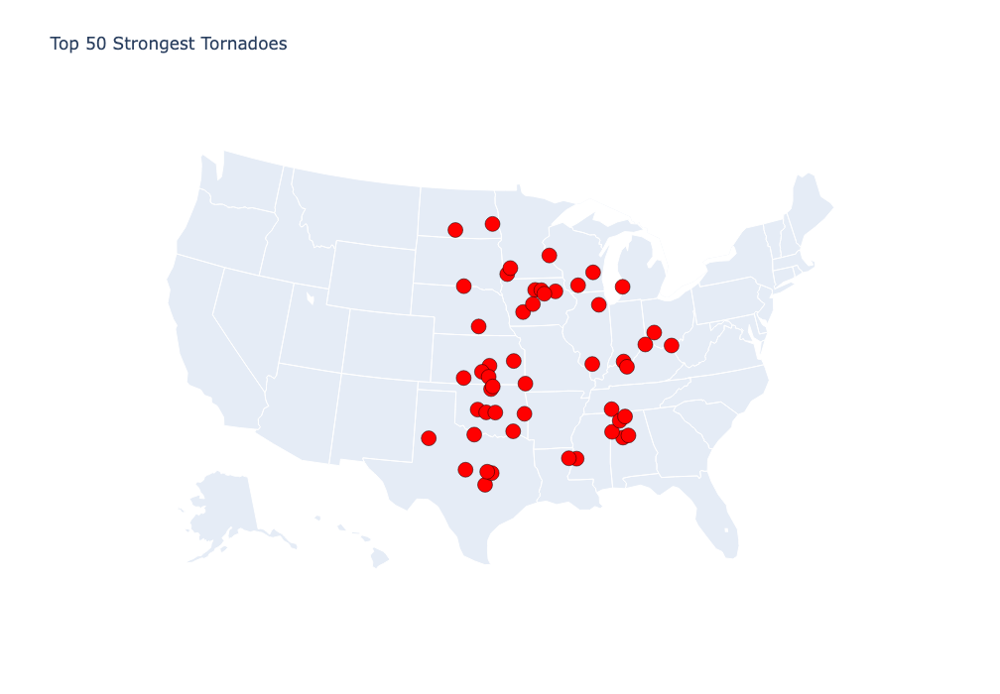

In [14]:
import plotly.graph_objs as go

top_tornadoes = data.sort_values(by='mag', ascending=False).head(50)

fig = go.Figure()

for _, row in top_tornadoes.iterrows():
    fig.add_trace(go.Scattergeo(
        lon=[row['slon']],
        lat=[row['slat']],
        text=f"Date: {row['date']}<br>State: {row['st']}<br>Mag: {row['mag']}",
        hoverinfo='text',
        mode='markers',
        marker=dict(
            size=row['mag']*3,
            color='red',
            line=dict(width=0.5, color='black')
        )
    ))

fig.update_layout(title='Top 50 Strongest Tornadoes', geo_scope='usa', height=700, width=1000, showlegend=False)
fig.show()


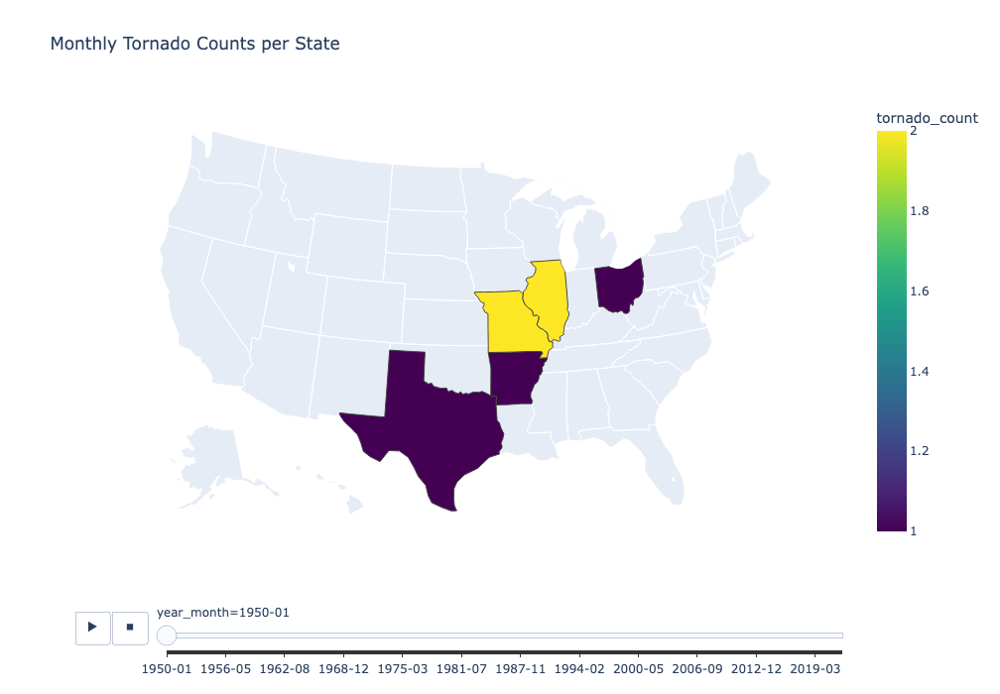

In [19]:
import plotly.express as px
import plotly.io as pio

data['year_month'] = data['date'].dt.to_period('M')
monthly_tornadoes = data.groupby(['year_month', 'st']).size().reset_index(name='tornado_count')

fig = px.choropleth(monthly_tornadoes, locations='st', color='tornado_count',
                    locationmode='USA-states', scope='usa',
                    title='Monthly Tornado Counts per State',
                    animation_frame='year_month', height=700,
                    color_continuous_scale='viridis')

pio.write_html(fig, file='tornadoes_2021_animation.html', auto_open=True)
fig.show()


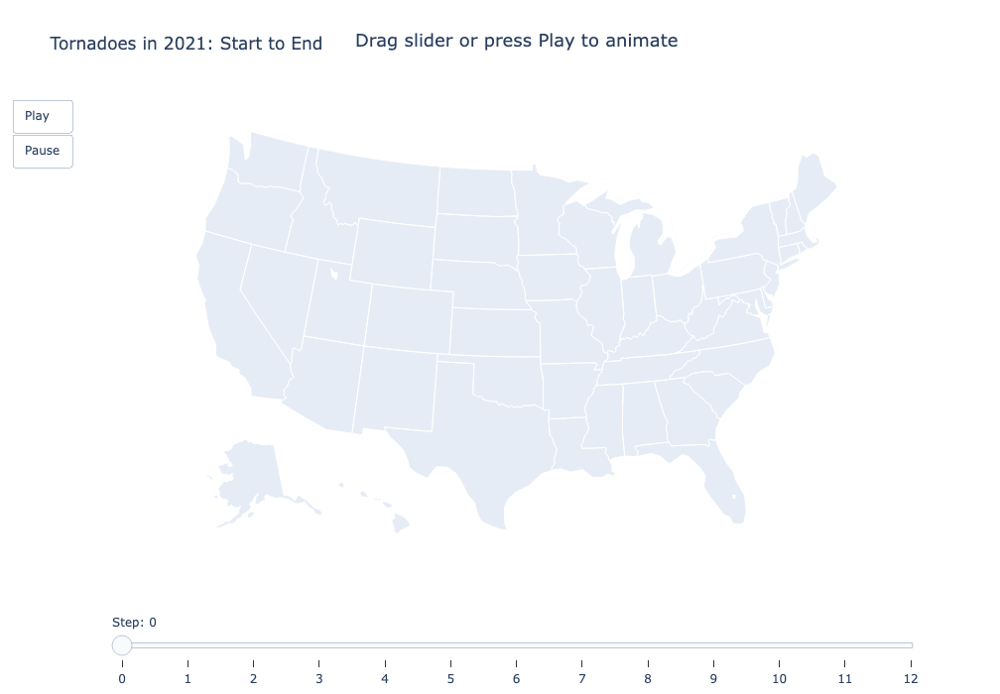

In [17]:
import plotly.graph_objs as go
import numpy as np
import plotly.io as pio


# Filter the dataset for 2021 tornadoes
tornadoes_2021 = data[data['yr'] == 2021]

# Calculate the number of frames needed for the animation
num_frames = 12

# Generate random colors for each tornado
tornado_colors = ['rgba' + str(tuple(np.random.randint(0, 256, 3).tolist()) + (0.7,)) for _ in tornadoes_2021.iterrows()]

# Create a base map with the start points of the tornadoes
fig = go.Figure()

# Add frames for each step of the animation
frames = []
for i in range(1, num_frames + 1):
    frame_data = []

    for idx, (_, row) in enumerate(tornadoes_2021.iterrows()):
        lat = row['slat'] + i * (row['elat'] - row['slat']) / num_frames
        lon = row['slon'] + i * (row['elon'] - row['slon']) / num_frames
        frame_data.append(go.Scattergeo(
            lat=[row['slat'], lat],
            lon=[row['slon'], lon],
            mode='lines',
            line=dict(width=3, color=tornado_colors[idx]),
            showlegend=False
        ))

    frames.append(go.Frame(data=frame_data, name=str(i)))

fig.frames = frames

# Set the initial data for the map
initial_data = []
for idx, (_, row) in enumerate(tornadoes_2021.iterrows()):
    initial_data.append(go.Scattergeo(
        lat=[row['slat'], row['slat']],
        lon=[row['slon'], row['slon']],
        mode='lines',
        line=dict(width=3, color=tornado_colors[idx]),
        showlegend=False
    ))

fig.add_traces(initial_data)

# Configure the slider and buttons to control the animation
sliders = [dict(
    active=0,
    currentvalue={"prefix": "Step: "},
    pad={"t": 50},
    steps=[dict(method="animate", args=[[str(i)], {"frame": {"duration": 25, "redraw": True}, "mode": "immediate"}], label=str(i)) for i in range(num_frames + 1)]
)]

fig.update_layout(
    title="Tornadoes in 2021: Start to End",
    height=700,
    updatemenus=[dict(type="buttons", showactive=False, buttons=list([
        dict(label="Play",
             method="animate",
             args=[None, dict(frame=dict(duration=25, redraw=True), fromcurrent=True, transition=dict(duration=0))]),
        dict(label="Pause",
             method="animate",
             args=[[None], dict(frame=dict(duration=0, redraw=True), mode="immediate", transition=dict(duration=0))])
    ]))],
    annotations=[dict(text="Drag slider or press Play to animate", showarrow=False,
                     xref="paper", yref="paper", x=0.5, y=1.1, xanchor="center", yanchor="bottom", font=dict(size=18))
    ],
    geo=dict(scope="usa", projection=dict(type="albers usa")),
    hovermode="closest",
    sliders=sliders
)

pio.write_html(fig, file='tornadoes_2021_animation.html', auto_open=True)
fig.show()
